# Segment Anything Model (SAM) for Coastline Detection

## Available Datasource

In [1]:
# read all tif file name in "data\Planet_data_EPSG28992"

import os
from datetime import datetime

planet_data_dir = "data/Planet_data_EPSG28992"
file_names = os.listdir(planet_data_dir)

# remove all names that have ".aux.xml" in them
file_names = [name for name in file_names if not name.endswith(".aux.xml")] 
# print(file_names)

# divide files into seasons based on leading YYYY-MM-DD in the filename
tif_files = [fn for fn in file_names if fn.lower().endswith(".tif") and len(fn) >= 10]

seasons = {"early": [], "mid": [], "late": []}
for fn in tif_files:
    try:
        dt = datetime.strptime(fn[:10], "%Y-%m-%d")
    except Exception:
        continue
    m = dt.month
    if 1 <= m <= 3:
        seasons["early"].append(fn)
    elif 4 <= m <= 9:
        seasons["mid"].append(fn)
    else:
        seasons["late"].append(fn)

# sort each season by date
for k in seasons:
    seasons[k].sort(key=lambda s: datetime.strptime(s[:10], "%Y-%m-%d"))

print({k: len(v) for k, v in seasons.items()})
seasons

{'early': 8, 'mid': 9, 'late': 7}


{'early': ['2018-02-22_strip_1201956_composite.tif',
  '2019-02-15_strip_2122432_composite.tif',
  '2020-02-07_strip_3113467_composite.tif',
  '2021-03-02_strip_4218715_composite.tif',
  '2022-03-08_strip_5468490_composite.tif',
  '2023-02-27_strip_6317538_composite.tif',
  '2024-03-02_strip_7145820_composite.tif',
  '2025-02-26_strip_7892478_composite.tif'],
 'mid': ['2017-07-06_strip_602670_composite.tif',
  '2018-06-29_strip_1532242_composite.tif',
  '2019-06-14_strip_2443911_composite.tif',
  '2020-06-24_strip_3512625_composite.tif',
  '2021-06-27_strip_4630194_composite.tif',
  '2022-06-21_strip_5728503_composite.tif',
  '2023-06-15_strip_6579851_composite.tif',
  '2024-06-23_strip_7392265_composite.tif',
  '2025-06-19_strip_8141392_composite.tif'],
 'late': ['2018-10-05_strip_1746499_composite.tif',
  '2019-10-16_strip_2755420_composite.tif',
  '2020-10-23_strip_3833704_composite.tif',
  '2021-10-15_strip_5001262_composite.tif',
  '2022-10-09_strip_5992163_composite.tif',
  '2023

In [2]:
from datetime import datetime

folder = "data\\Planet_data_EPSG28992\\"

summer_months = [
    "2025-06-19_strip_8141392_composite.tif",
    "2024-06-23_strip_7392265_composite.tif",
    "2023-06-15_strip_6579851_composite.tif",
    #"2022-10-09_strip_5992163_composite.tif",
    "2022-06-21_strip_5728503_composite.tif",
    "2021-06-27_strip_4630194_composite.tif",
    "2020-06-24_strip_3512625_composite.tif",
    "2019-06-14_strip_2443911_composite.tif",
    "2018-06-29_strip_1532242_composite.tif",
    "2017-07-06_strip_602670_composite.tif"
]

winter_months = [
    "2025-02-26_strip_7892478_composite.tif",
    "2024-10-05_strip_7618271_composite.tif",
    "2020-10-23_strip_3833704_composite.tif",
    "2020-02-07_strip_3113467_composite.tif",
    "2019-10-16_strip_2755420_composite.tif",
    "2019-02-15_strip_2122432_composite.tif",
    "2018-10-05_strip_1746499_composite.tif",
    "2018-02-22_strip_1201956_composite.tif",
    "2017-10-15_strip_838927_composite.tif"
]

# Sort lists by the leading YYYY-MM-DD date (ascending)
def _sort_by_date(lst):
    return sorted(lst, key=lambda s: datetime.strptime(s[:10], "%Y-%m-%d"))

summer_months = _sort_by_date(summer_months)
winter_months = _sort_by_date(winter_months)

In [3]:
# Replace summer_months with selected_files for subsequent operations

season_name = "mid"
selected_files = seasons[season_name]

In [4]:
# print elements in selected_files and file sizes
import os
for fname in selected_files:
    fpath = os.path.join(folder, fname)
    if os.path.exists(fpath):
        fsize = os.path.getsize(fpath) / (1024 * 1024)
        print(f"{fname}: {fsize:.2f} MB")
    else:
        print(f"{fname}: file not found")

2017-07-06_strip_602670_composite.tif: 27.22 MB
2018-06-29_strip_1532242_composite.tif: 27.22 MB
2019-06-14_strip_2443911_composite.tif: 27.22 MB
2020-06-24_strip_3512625_composite.tif: 27.22 MB
2021-06-27_strip_4630194_composite.tif: 27.22 MB
2022-06-21_strip_5728503_composite.tif: 27.22 MB
2023-06-15_strip_6579851_composite.tif: 27.22 MB
2024-06-23_strip_7392265_composite.tif: 27.22 MB
2025-06-19_strip_8141392_composite.tif: 27.22 MB


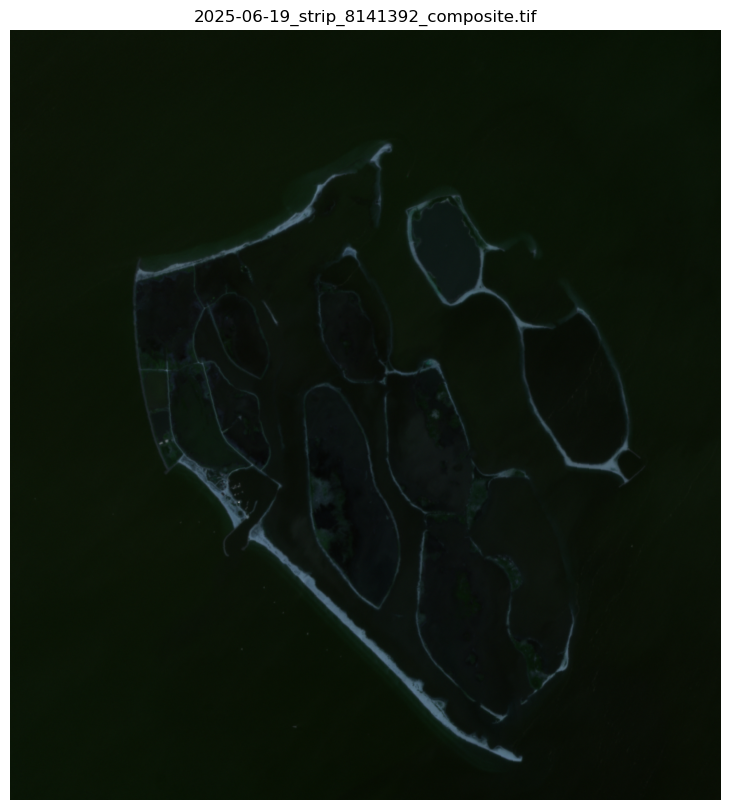

In [5]:
import os
import numpy as np
import rasterio

import matplotlib.pyplot as plt

# index of the file to plot
idx = -1

fname = selected_files[idx]
fpath = os.path.join(folder, fname)

if not os.path.exists(fpath):
    print(f"File not found: {fpath}")
else:
    with rasterio.open(fpath) as src:
        count = src.count
        if count >= 3:
            # read first 3 bands as RGB
            img = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)

            # # simple contrast stretch using 2nd and 98th percentiles per band
            # img_norm = np.zeros_like(img, dtype=np.float32)
            # for b in range(3):
            #     p15, p98 = np.percentile(img[:, :, b], (15, 98))
            #     img_norm[:, :, b] = np.clip((img[:, :, b] - p15) / (p98 - p15 + 1e-9), 0, 1)

            # normalize image using min-max normalization across all bands
            img_norm = (img - img.min()) / (img.max() - img.min() + 1e-12)


            plt.figure(figsize=(10, 10))
            plt.imshow(img_norm)
        else:
            # single-band grayscale
            arr = src.read(1)
            p15, p98 = np.percentile(arr, (15, 98))
            arr_norm = np.clip((arr - p15) / (p98 - p15 + 1e-9), 0, 1)
            plt.figure(figsize=(8, 8))
            plt.imshow(arr_norm, cmap="gray")

    plt.title(fname)
    plt.axis("off")
    plt.show()

## SAM

In [54]:
# !pip install git+https://github.com/facebookresearch/segment-anything.git
# !pip install opencv-python-headless matplotlib

In [55]:
# install missing runtime packages (fixes ModuleNotFoundError: No module named 'torch')
# use %pip so packages are installed into the current Jupyter environment
# %pip install torch torchvision torchaudio --quiet
# %pip install git+https://github.com/facebookresearch/segment-anything.git --quiet
# %pip install geopandas --quiet

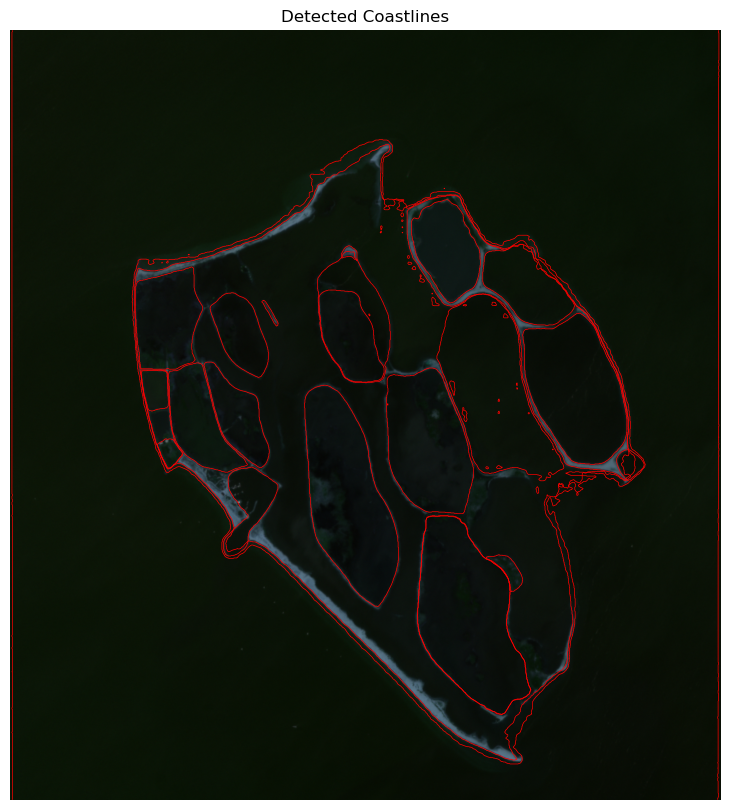

In [7]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator
from shapely.geometry import shape
from rasterio.features import shapes

# Load SAM model (download checkpoint automatically if missing)
sam_checkpoint = "sam_vit_h_4b8939.pth"  # Download this from SAM's GitHub if missing
if not os.path.exists(sam_checkpoint):
    print(f"Checkpoint '{sam_checkpoint}' not found. Downloading...")
    url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth"
    import urllib.request
    try:
        urllib.request.urlretrieve(url, sam_checkpoint)
        print("Download complete.")
    except Exception as e:
        raise RuntimeError(f"Failed to download SAM checkpoint from {url}: {e}")
    
# Load SAM model
sam = sam_model_registry["vit_h"](checkpoint=sam_checkpoint)
mask_generator = SamAutomaticMaskGenerator(sam)

# Load satellite image
folder = "data/Planet_data_EPSG28992/"
fname = "2025-06-19_strip_8141392_composite.tif"  # Example file
fpath = os.path.join(folder, fname)

with rasterio.open(fpath) as src:
    img = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)
    # Normalize image for SAM
    img = (img - img.min()) / (img.max() - img.min())

# Generate masks using SAM
masks = mask_generator.generate(img)

# Visualize masks
plt.figure(figsize=(10, 10))
plt.imshow(img)
for mask in masks:
    plt.contour(mask["segmentation"], colors="red", linewidths=0.5)
plt.title("Detected Coastlines")
plt.axis("off")
plt.show()

# Extract coastlines as vector geometries
coastlines = []
for mask in masks:
    mask_array = mask["segmentation"].astype("uint8")
    for geom, val in shapes(mask_array, transform=src.transform):
        if val == 1:  # Extract only the mask region
            coastlines.append(shape(geom))

In [ ]:
# Save coastlines as GeoJSON
import geopandas as gpd
gdf = gpd.GeoDataFrame({"geometry": coastlines})
gdf.to_file("coastlines.geojson", driver="GeoJSON")
print("Coastlines saved to 'coastlines.geojson'")

In [14]:
season_name = "early"
selected_files = seasons[season_name][5:]
selected_files

['2023-02-27_strip_6317538_composite.tif',
 '2024-03-02_strip_7145820_composite.tif',
 '2025-02-26_strip_7892478_composite.tif']

Saved: SAM_results\2022-03-08_strip_5468490_composite_coastlines.geojson


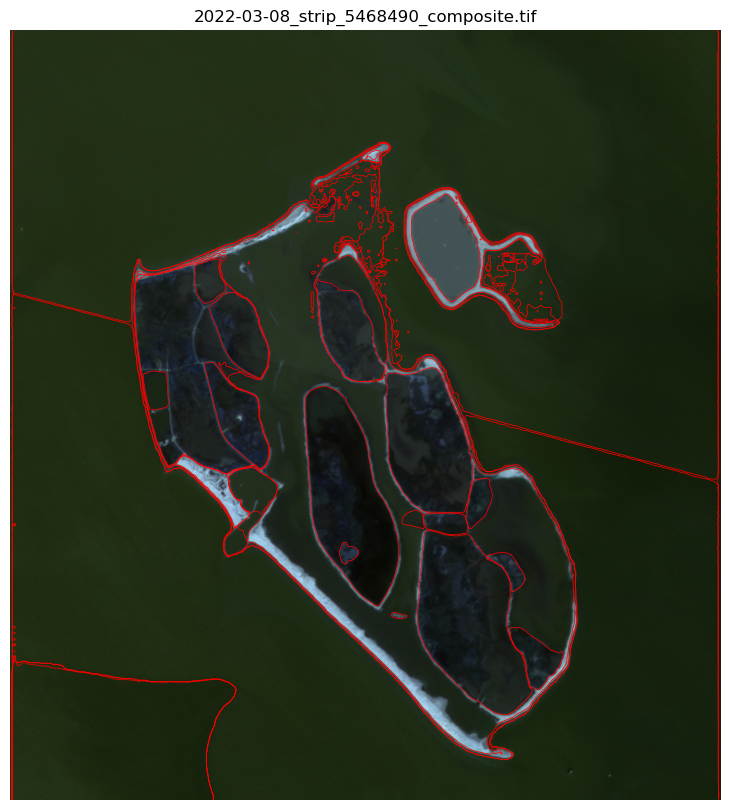

Overlay saved: SAM_results\2022-03-08_strip_5468490_composite_coastlines.png
Saved: SAM_results\2023-02-27_strip_6317538_composite_coastlines.geojson


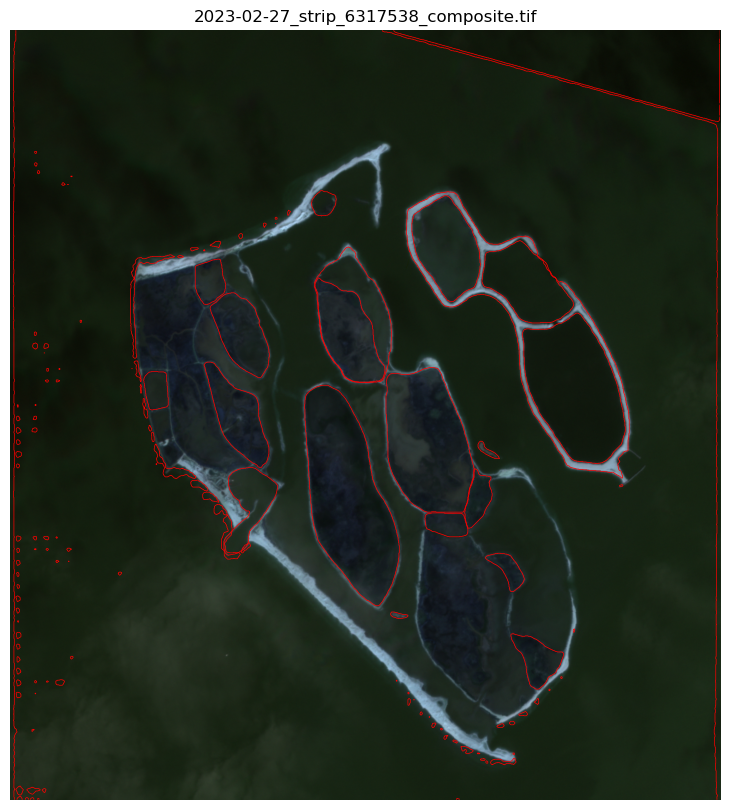

Overlay saved: SAM_results\2023-02-27_strip_6317538_composite_coastlines.png
Saved: SAM_results\2024-03-02_strip_7145820_composite_coastlines.geojson


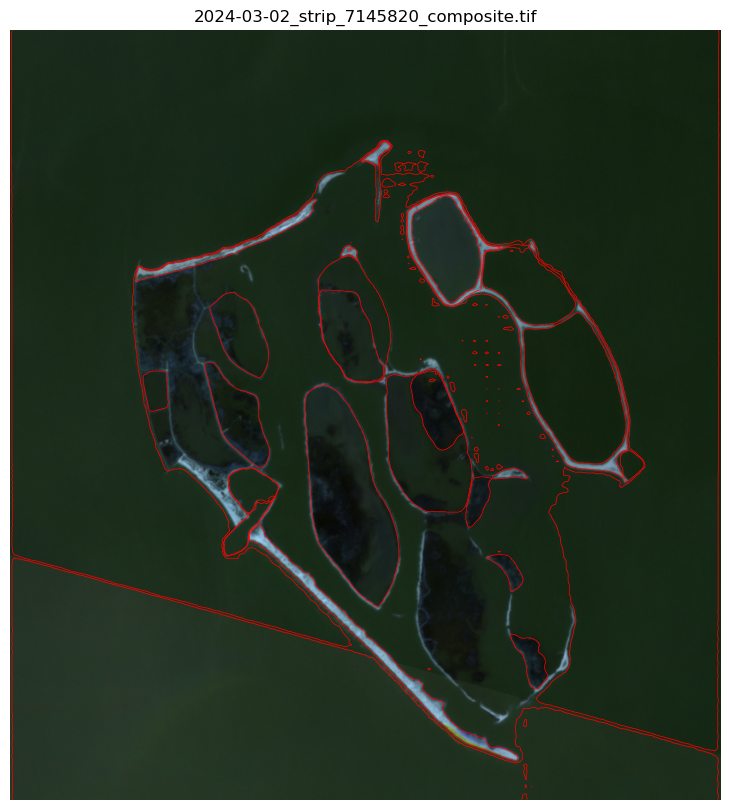

Overlay saved: SAM_results\2024-03-02_strip_7145820_composite_coastlines.png
Saved: SAM_results\2025-02-26_strip_7892478_composite_coastlines.geojson


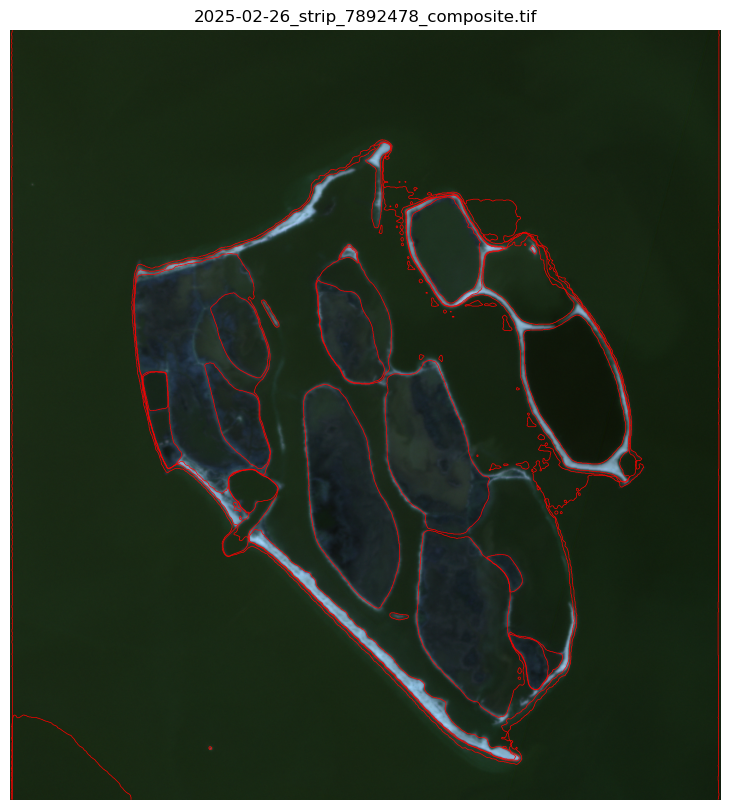

Overlay saved: SAM_results\2025-02-26_strip_7892478_composite_coastlines.png


In [ ]:
import os

# Extract coastlines for all files in selected_files, save GeoJSONs and PNG overlays in SAM_results,
# and plot contours on the original RGB image.

output_dir = "SAM_results"
os.makedirs(output_dir, exist_ok=True)

for fname in selected_files:
    fpath = os.path.join(folder, fname)
    if not os.path.exists(fpath):
        print(f"File not found, skipping: {fpath}")
        continue

    try:
        with rasterio.open(fpath) as src:
            # Read RGB (or single band) and normalize for SAM
            if src.count >= 3:
                img = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)
            else:
                arr = src.read(1).astype(np.float32)
                img = np.repeat(arr[:, :, None], 3, axis=2)

            img = (img - img.min()) / (img.max() - img.min() + 1e-12)

            # Generate masks via SAM
            masks = mask_generator.generate(img)

            # Convert masks to geospatial polygons using the raster transform
            coast_geoms = []
            for mask in masks:
                mask_array = mask["segmentation"].astype("uint8")
                for geom, val in shapes(mask_array, transform=src.transform):
                    if val == 1:
                        coast_geoms.append(shape(geom))

            # Save GeoJSON if any geometries found
            if coast_geoms:
                gdf_out = gpd.GeoDataFrame({"geometry": coast_geoms}, crs=src.crs)
                out_geo = os.path.join(output_dir, os.path.splitext(fname)[0] + "_coastlines.geojson")
                gdf_out.to_file(out_geo, driver="GeoJSON")
                print(f"Saved: {out_geo}")
            else:
                print(f"No coastlines extracted for {fname}")

            # Plot original image and overlay mask contours
            plt.figure(figsize=(10, 10))
            plt.imshow(img)
            for mask in masks:
                plt.contour(mask["segmentation"], colors="red", linewidths=0.5)
            plt.title(fname)
            plt.axis("off")

            out_png = os.path.join(output_dir, os.path.splitext(fname)[0] + "_coastlines.png")
            plt.savefig(out_png, bbox_inches="tight", dpi=150)
            plt.show()
            print(f"Overlay saved: {out_png}")

    except Exception as e:
        print(f"Error processing {fname}: {e}")

## Test the saved shorelines

In [ ]:
import geopandas as gpd
gdf = gpd.GeoDataFrame({"geometry": coastlines})

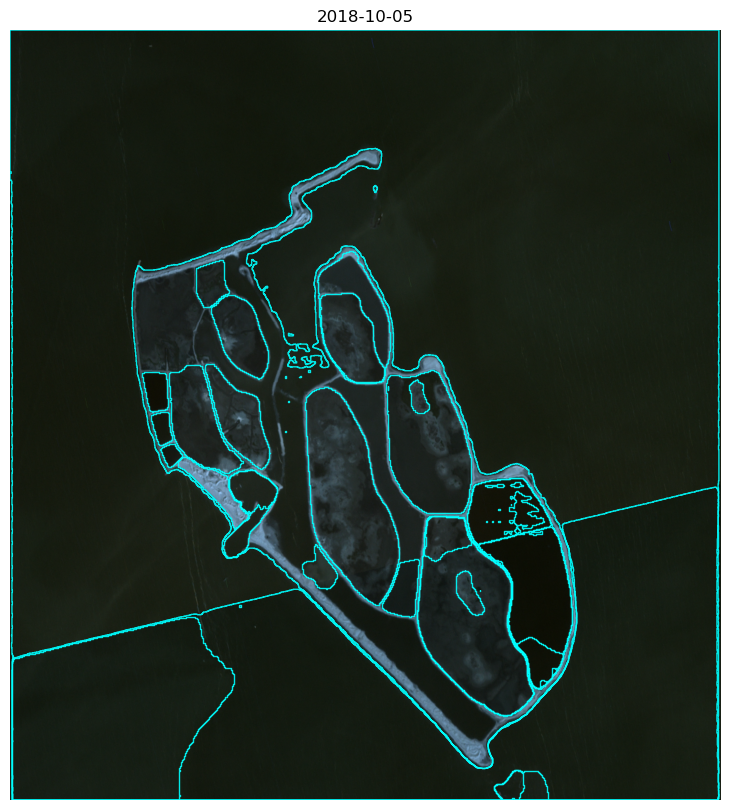

Saved overlay: SAM_results/late\2018-10-05_strip_1746499_composite_coastlines_overlay.png


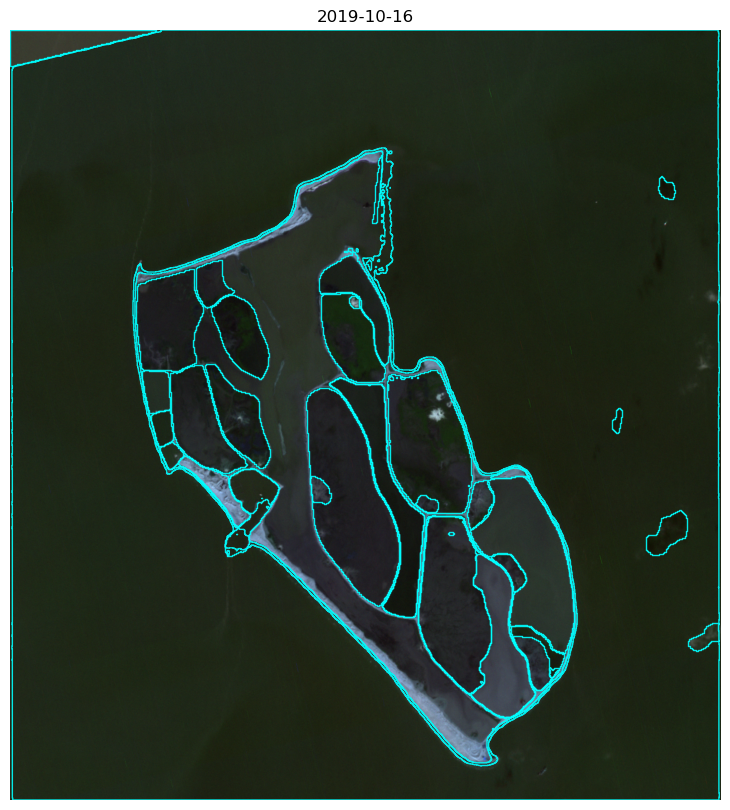

Saved overlay: SAM_results/late\2019-10-16_strip_2755420_composite_coastlines_overlay.png


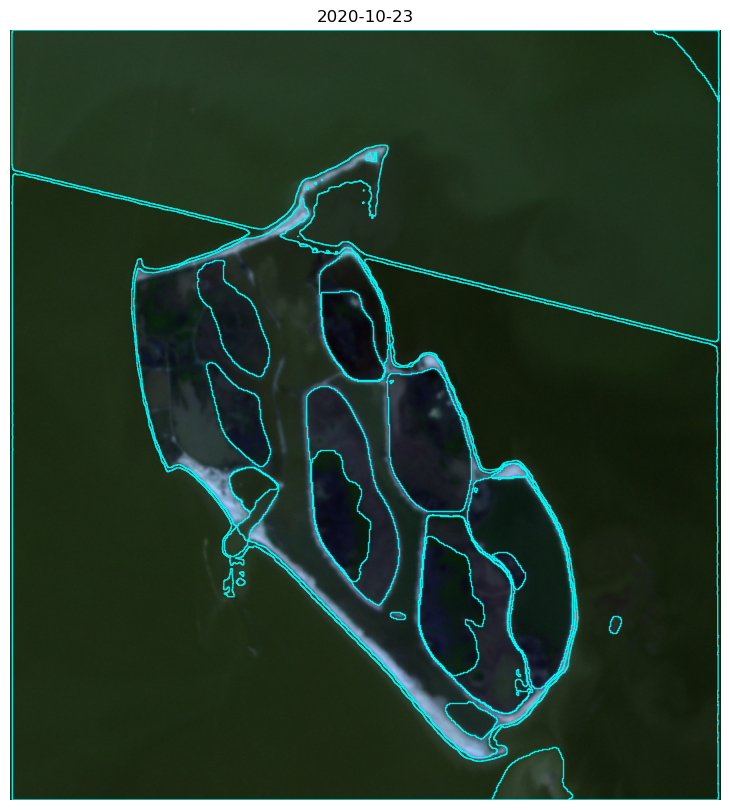

Saved overlay: SAM_results/late\2020-10-23_strip_3833704_composite_coastlines_overlay.png


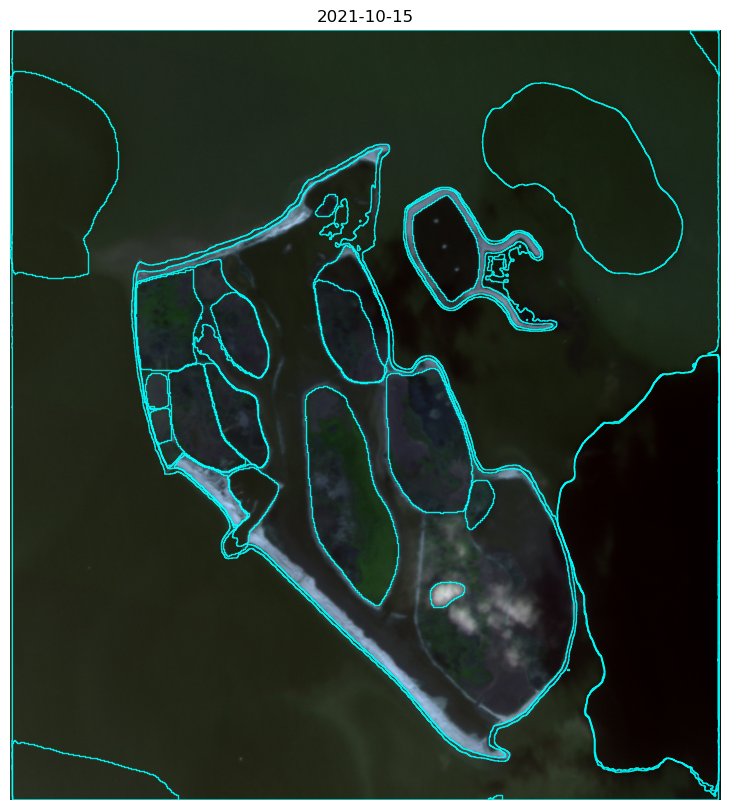

Saved overlay: SAM_results/late\2021-10-15_strip_5001262_composite_coastlines_overlay.png


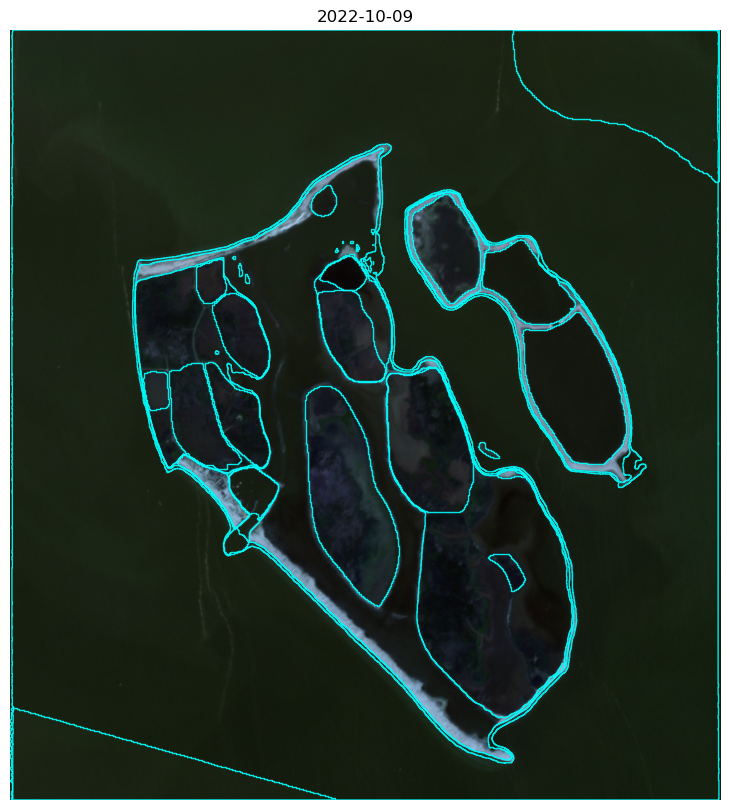

Saved overlay: SAM_results/late\2022-10-09_strip_5992163_composite_coastlines_overlay.png


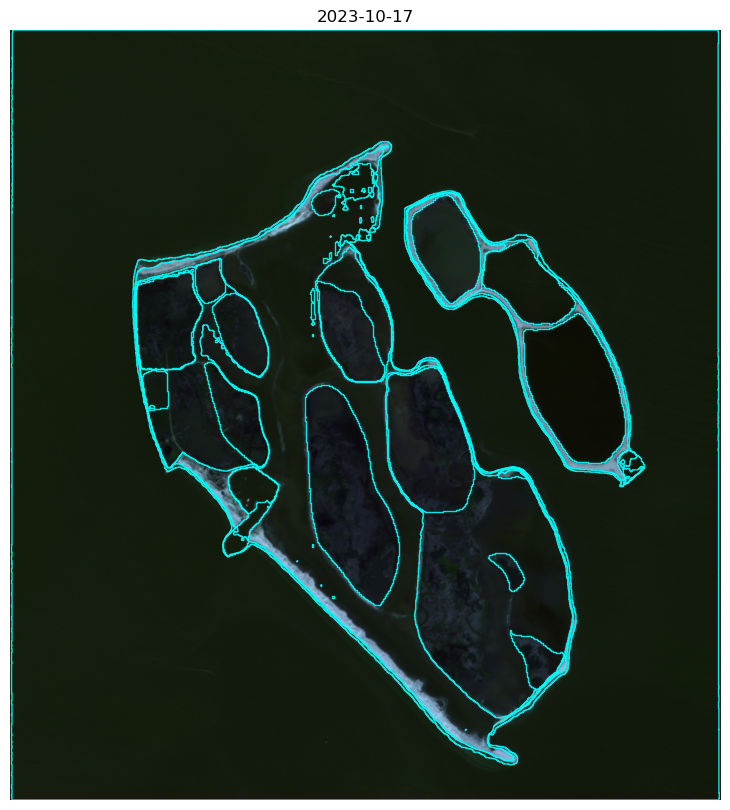

Saved overlay: SAM_results/late\2023-10-17_strip_6840706_composite_coastlines_overlay.png


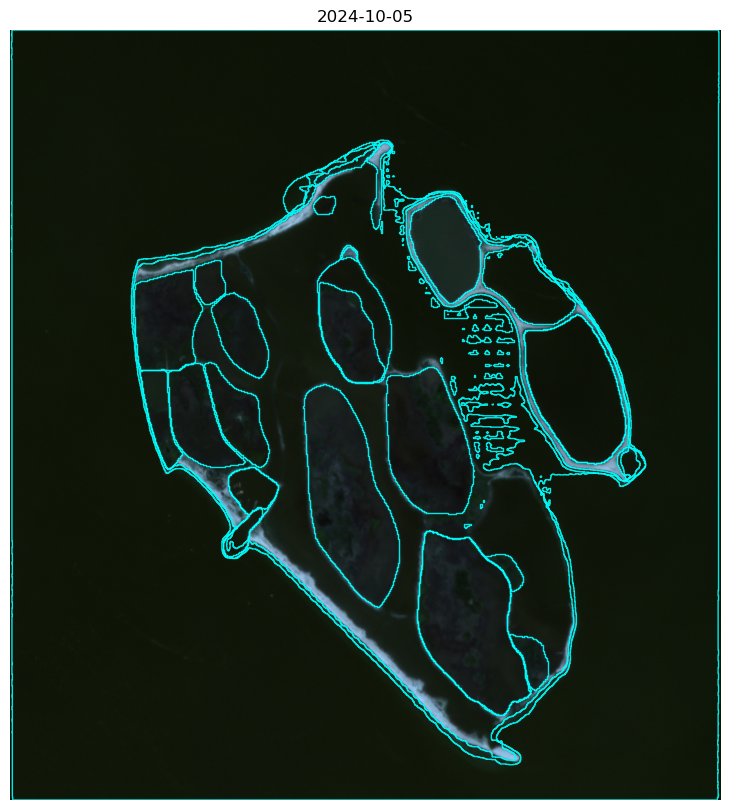

Saved overlay: SAM_results/late\2024-10-05_strip_7618271_composite_coastlines_overlay.png


In [57]:
### Plot saved shorelines (overlay GeoJSON on the original RGB image)

# Use the GeoJSON files in `SAM_results` and the matching TIFF in `folder`. The code below
# iterates saved `_coastlines.geojson` files, opens the corresponding TIFF, displays the RGB
# (or single-band) image with the shoreline polygons overlaid, and saves an overlay PNG next to each GeoJSON.

# output_dir = "SAM_results/{season_name}"
season_name = "late"
output_dir = "SAM_results/" + season_name

for geo_fn in sorted(os.listdir(output_dir)):
    if not geo_fn.endswith("_coastlines.geojson"):
        continue

    geo_path = os.path.join(output_dir, geo_fn)
    tif_name = geo_fn.replace("_coastlines.geojson", ".tif")
    tif_path = os.path.join(folder, tif_name)

    if not os.path.exists(tif_path):
        print(f"Skipping (tif not found): {tif_name}")
        continue

    # build output PNG path here, after geo_fn is defined
    out_png = os.path.join(output_dir, os.path.splitext(geo_fn)[0] + "_overlay.png")

    gdf_plot = gpd.read_file(geo_path)

    with rasterio.open(tif_path) as src:
        if src.count >= 3:
            img_plot = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)
        else:
            arr = src.read(1).astype(np.float32)
            img_plot = np.repeat(arr[:, :, None], 3, axis=2)

        img_plot = (img_plot - img_plot.min()) / (img_plot.max() - img_plot.min() + 1e-12) # normalize
        extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img_plot, extent=extent)
    gdf_plot.plot(ax=ax, facecolor="none", edgecolor="cyan", linewidth=1, alpha=0.9)
    ax.set_title(tif_name[:10])
    ax.axis("off")

    plt.savefig(out_png, bbox_inches="tight", dpi=150)
    plt.show()
    print(f"Saved overlay: {out_png}")

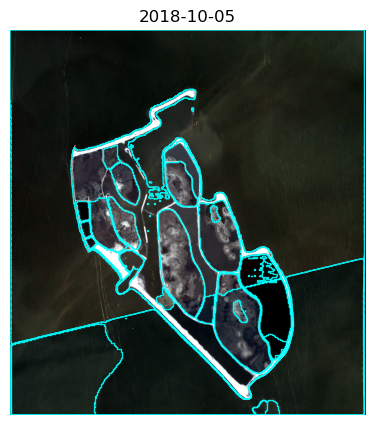

Saved overlay: SAM_results/late\2018-10-05_strip_1746499_composite_coastlines_overlay_contrast.png


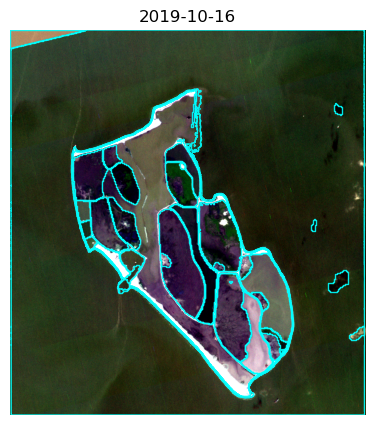

Saved overlay: SAM_results/late\2019-10-16_strip_2755420_composite_coastlines_overlay_contrast.png


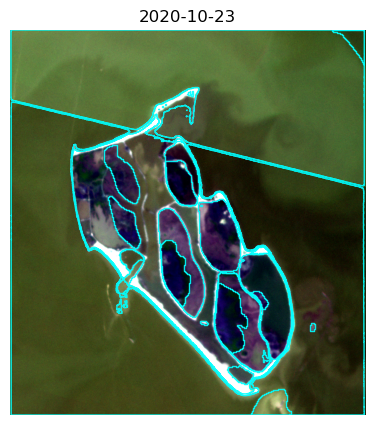

Saved overlay: SAM_results/late\2020-10-23_strip_3833704_composite_coastlines_overlay_contrast.png


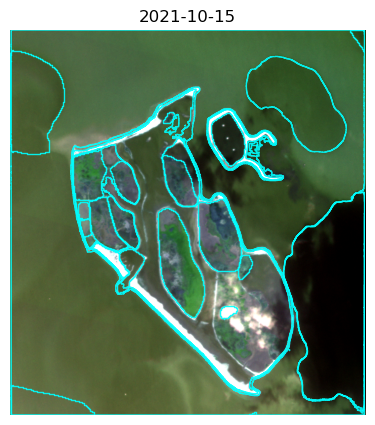

Saved overlay: SAM_results/late\2021-10-15_strip_5001262_composite_coastlines_overlay_contrast.png


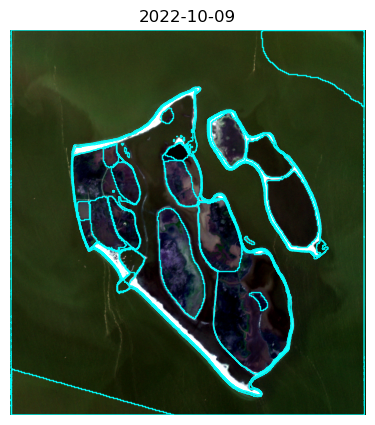

Saved overlay: SAM_results/late\2022-10-09_strip_5992163_composite_coastlines_overlay_contrast.png


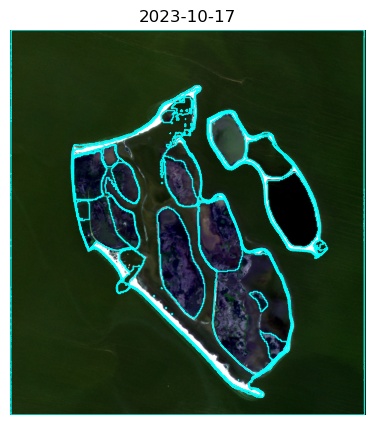

Saved overlay: SAM_results/late\2023-10-17_strip_6840706_composite_coastlines_overlay_contrast.png


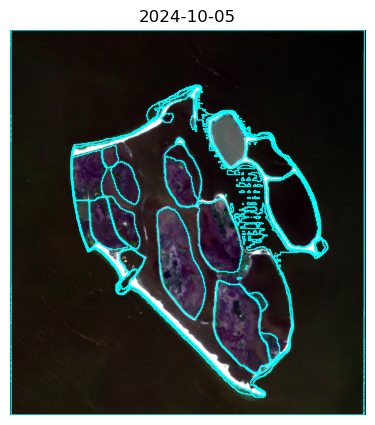

Saved overlay: SAM_results/late\2024-10-05_strip_7618271_composite_coastlines_overlay_contrast.png


In [22]:
### Plot saved shorelines (overlay GeoJSON on the original RGB image)

# Use the GeoJSON files in `SAM_results` and the matching TIFF in `folder`. The code below
# iterates saved `_coastlines.geojson` files, opens the corresponding TIFF, displays the RGB
# (or single-band) image with the shoreline polygons overlaid, and saves an overlay PNG next to each GeoJSON.

# output_dir = "SAM_results/{season_name}"
season_name = "late"
output_dir = "SAM_results/" + season_name

for geo_fn in sorted(os.listdir(output_dir)):
    if not geo_fn.endswith("_coastlines.geojson"):
        continue

    geo_path = os.path.join(output_dir, geo_fn)
    tif_name = geo_fn.replace("_coastlines.geojson", ".tif")
    tif_path = os.path.join(folder, tif_name)

    if not os.path.exists(tif_path):
        print(f"Skipping (tif not found): {tif_name}")
        continue

    # build output PNG path here, after geo_fn is defined
    out_png = os.path.join(output_dir, os.path.splitext(geo_fn)[0] + "_overlay_contrast.png")

    gdf_plot = gpd.read_file(geo_path)

    with rasterio.open(tif_path) as src:
        if src.count >= 3:
            img_plot = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)
        else:
            arr = src.read(1).astype(np.float32)
            img_plot = np.repeat(arr[:, :, None], 3, axis=2)

        # contrast stretch per band using 2nd and 98th percentiles
        img_cs = np.zeros_like(img_plot, dtype=np.float32)
        for b in range(img_plot.shape[2]):
            p2, p98 = np.percentile(img_plot[:, :, b], (2, 98))
            img_cs[:, :, b] = np.clip((img_plot[:, :, b] - p2) / (p98 - p2 + 1e-9), 0, 1)
        img_plot = img_cs
        extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(img_plot, extent=extent)
    gdf_plot.plot(ax=ax, facecolor="none", edgecolor="cyan", linewidth=1, alpha=0.9)
    ax.set_title(tif_name[:10])
    ax.axis("off")

    plt.savefig(out_png, bbox_inches="tight", dpi=150)
    plt.show()
    print(f"Saved overlay: {out_png}")

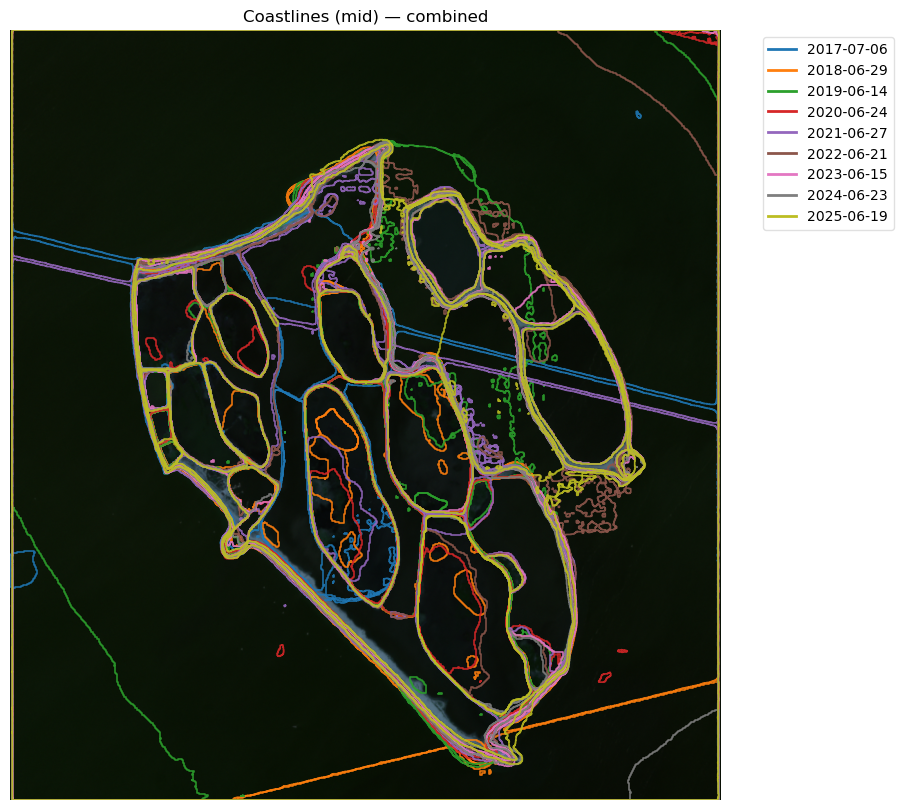

Saved combined overlay: SAM_results/mid\mid_coastlines_combined.png


In [63]:
import os
from matplotlib.lines import Line2D

# Single combined overlay: plot all saved coastlines (one figure, different colors)
import matplotlib.pyplot as plt

# use coastline_folder and basemap_folder/selected_files from later cells (they may be defined)
s_name = "mid"
coastline_folder = "SAM_results/" + s_name
basemap_folder = "data/Planet_data_EPSG28992/"  # use original Planet data folder as basemap source
output_dir = coastline_folder  # e.g. "SAM_results/{season_name}/"

# pick a reference TIFF to display as basemap (use last available selected_files)
ref_tif_name = selected_files[-1]
ref_tif = os.path.join(basemap_folder, ref_tif_name)

# collect geojson files
geojsons = sorted([f for f in os.listdir(output_dir) if f.endswith("_coastlines.geojson")])
if not geojsons:
    raise FileNotFoundError("No *_coastlines.geojson files found in " + output_dir)

# prepare colors
cmap = plt.get_cmap("tab10")
colors = [cmap(i % cmap.N) for i in range(len(geojsons))]

# read reference image
with rasterio.open(ref_tif) as src:
    if src.count >= 3:
        base_img = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)
    else:
        arr = src.read(1).astype(np.float32)
        base_img = np.repeat(arr[:, :, None], 3, axis=2)
    base_img = (base_img - base_img.min()) / (base_img.max() - base_img.min() + 1e-12)
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    raster_crs = src.crs

fig, ax = plt.subplots(figsize=(12, 10))
ax.imshow(base_img, extent=extent)

legend_items = []
for i, gj in enumerate(geojsons):
    gj_path = os.path.join(output_dir, gj)
    gdf = gpd.read_file(gj_path)
    # ensure CRS matches raster
    if gdf.crs != raster_crs:
        try:
            gdf = gdf.to_crs(raster_crs)
        except Exception:
            # if conversion fails, skip this file
            print(f"Skipping (CRS mismatch, cannot reproject): {gj}")
            continue

    label = gj[:10]  # use leading date as label
    color = colors[i]
    gdf.plot(ax=ax, facecolor="none", edgecolor=color, linewidth=1.2, alpha=0.9)
    legend_items.append(Line2D([0], [0], color=color, lw=2, label=label))

ax.set_title(f"Coastlines ({s_name}) — combined")
ax.axis("off")
# create legend without duplicate labels
by_label = {}
for h in legend_items:
    by_label[h.get_label()] = h
ax.legend(by_label.values(), by_label.keys(), loc="upper left", bbox_to_anchor=(1.05, 1), fontsize="medium", framealpha=0.6)

out_combined = os.path.join(output_dir, f"{s_name}_coastlines_combined.png")
plt.savefig(out_combined, bbox_inches="tight", dpi=200)
plt.show()
print(f"Saved combined overlay: {out_combined}")

In [64]:
# Boundaries of study areas in [min_x, min_y, max_x, max_y] format
study_area = {"Northwest": [152700, 512000, 154900, 513450], 
              "Southwest": [153650, 508300, 155950, 510400],
              "Southeast": [155850, 508900, 156350, 510900]}

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Southeast at mid season to SAM_results/study_areas/mid_Southeast_sam_coastlines_combined.png


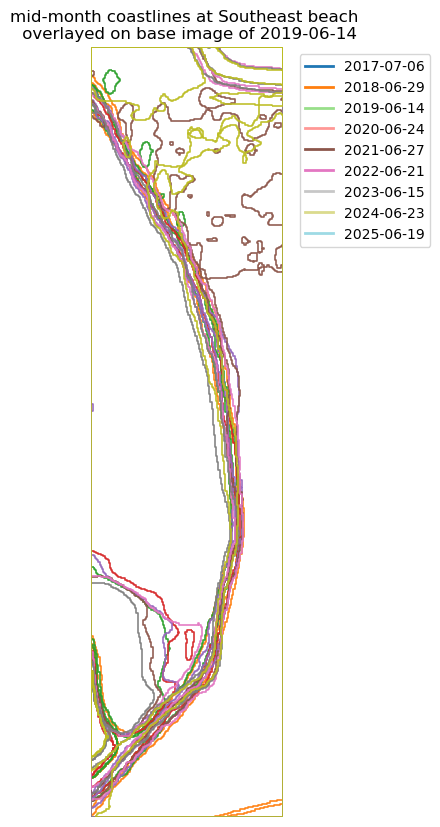

In [ ]:
# Plot only one study area with saved coastlines overlayed
from shapely.geometry import box
import rasterio
import rasterio.windows

# choose study area name
study_name = "Southeast"  # change to "Northwest" or "Southwest" as needed
minx, miny, maxx, maxy = study_area[study_name]
bbox_geom = box(minx, miny, maxx, maxy)

# season / folder containing coastlines
s_name = "mid"
selected_files = seasons[s_name]
coastline_folder = f"SAM_results/{s_name}"
geojsons = sorted([f for f in os.listdir(coastline_folder) if f.endswith("_coastlines.geojson")])
if not geojsons:
    raise FileNotFoundError(f"No *_coastlines.geojson files found in {coastline_folder}")

# Ensure a year_colors mapping exists (create a default if missing)
if "year_colors" not in globals():
    # try to build from available data (preferred: unique_years, else derive from selected_files)
    yrs = []
    if "unique_years" in globals():
        try:
            yrs = sorted(int(y) for y in unique_years)
        except Exception:
            yrs = []
    if not yrs and "selected_files" in globals():
        try:
            yrs = sorted({int(os.path.basename(fn)[:4]) for fn in selected_files})
        except Exception:
            yrs = []
    # fallback: a small fixed set
    if not yrs:
        yrs = [2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025]
    cmap = plt.get_cmap("tab10")
    year_colors = {np.int64(y): cmap(i % cmap.N) for i, y in enumerate(sorted(yrs))}
    # also ensure int keys map (some code may use int instead of np.int64)
    for k, v in list(year_colors.items()):
        year_colors[int(k)] = v

# reference raster (use last selected file as reference)
ref_tif = os.path.join(folder, selected_files[2])

# read raster window for bbox
with rasterio.open(ref_tif) as src:
    # ensure CRS alignment between bbox and raster (assume bbox already in raster CRS)
    win = rasterio.windows.from_bounds(minx, miny, maxx, maxy, src.transform)
    # round to integer window
    win = win.round_offsets().round_shape()
    arr = src.read(window=win)  # shape (bands, rows, cols)
    if arr.shape[0] >= 3:
        img = np.stack([arr[i] for i in range(3)], axis=-1).astype(np.float32)
    else:
        a = arr[0].astype(np.float32)
        img = np.repeat(a[:, :, None], 3, axis=2)
    # normalize for display
    img = (img - img.min()) / (img.max() - img.min() + 1e-12)

    # compute extent from window transform
    win_t = src.window_transform(win)
    left, top = win_t * (0, 0)
    right, bottom = win_t * (img.shape[1], img.shape[0])
    extent = [left, right, bottom, top]  # imshow expects [xmin, xmax, ymin, ymax]

    raster_crs = src.crs

# plot cropped basemap and coastlines that intersect the bbox
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(img, extent=extent)
# ax.set_title(f"{s_name}-month coastlines at {study_name} beach \n overlayed on base image of {selected_files[2][:10]}")
ax.set_title(f"{s_name}-month coastlines at {study_name} beach \n")
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.axis("off")

import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

# Prepare a colormap
cmap = plt.get_cmap("tab10")  # You can use other colormaps like "viridis", "plasma", etc.
colors = [cmap(i % cmap.N) for i in range(len(geojsons))]  # Generate unique colors for each file

for i, gj in enumerate(geojsons):
    gj_path = os.path.join(coastline_folder, gj)
    gdf = gpd.read_file(gj_path)
    
    # Reproject if needed
    if gdf.crs != raster_crs:
        try:
            gdf = gdf.to_crs(raster_crs)
        except Exception:
            print(f"Skipping (CRS mismatch, cannot reproject): {gj}")
            continue
    
    # Select only geometries intersecting the bounding box
    sel = gdf[gdf.geometry.intersects(bbox_geom)]
    if sel.empty:
        continue
    
    # Clip to bounding box for cleaner plotting
    try:
        sel_clip = sel.clip(bbox_geom)
    except Exception:
        sel_clip = sel  # Fallback to full selection if clipping fails
    
    # Plot with a unique color
    sel_clip.plot(ax=ax, facecolor="none", edgecolor=colors[i], linewidth=1.2, alpha=0.95)

# add legend with years if possible
legend_items = []
for i, gj in enumerate(geojsons):
    year_str = gj[:4]
    try:
        year = int(year_str)
        color = year_colors.get(year, colors[i])
        legend_items.append(Line2D([0], [0], color=color, lw=2, label=gj[:10]))
    except Exception:
        continue

plt.legend(handles=legend_items, bbox_to_anchor=(1.05, 1), loc='upper left')

# save output
out_folder = "SAM_results/study_areas/"
out_combined = os.path.join(out_folder, f"{s_name}_{study_name}_sam_coastlines_combined.png")
plt.savefig(out_combined, bbox_inches="tight", dpi=200)
#print plot status
print(f"Saving combined overlay for {study_name} at {s_name} season to {out_combined}")
plt.show()

In [109]:
seasons.keys()

dict_keys(['early', 'mid', 'late'])

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Northwest at early season to SAM_results/study_areas/early_Northwest_sam_coastlines_combined.png


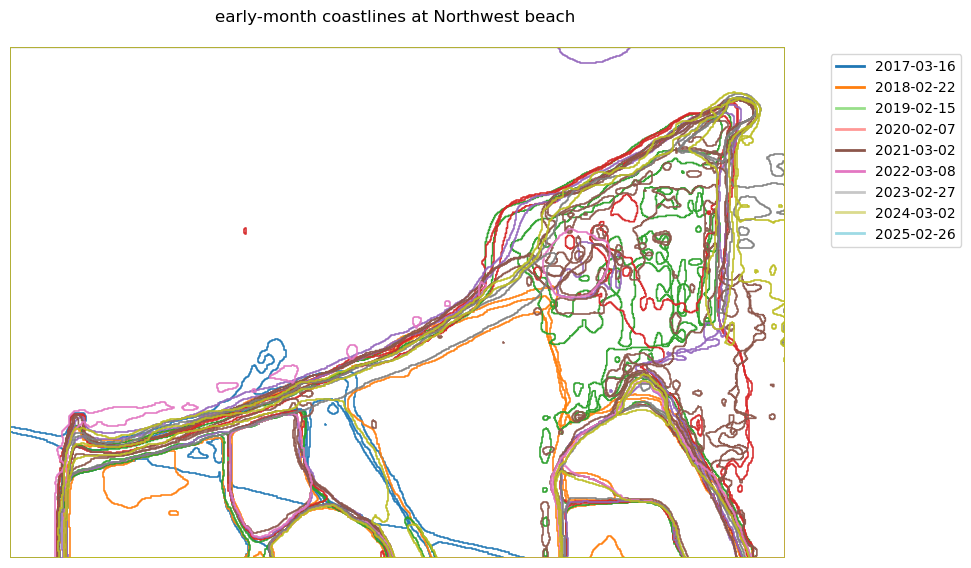

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Southwest at early season to SAM_results/study_areas/early_Southwest_sam_coastlines_combined.png


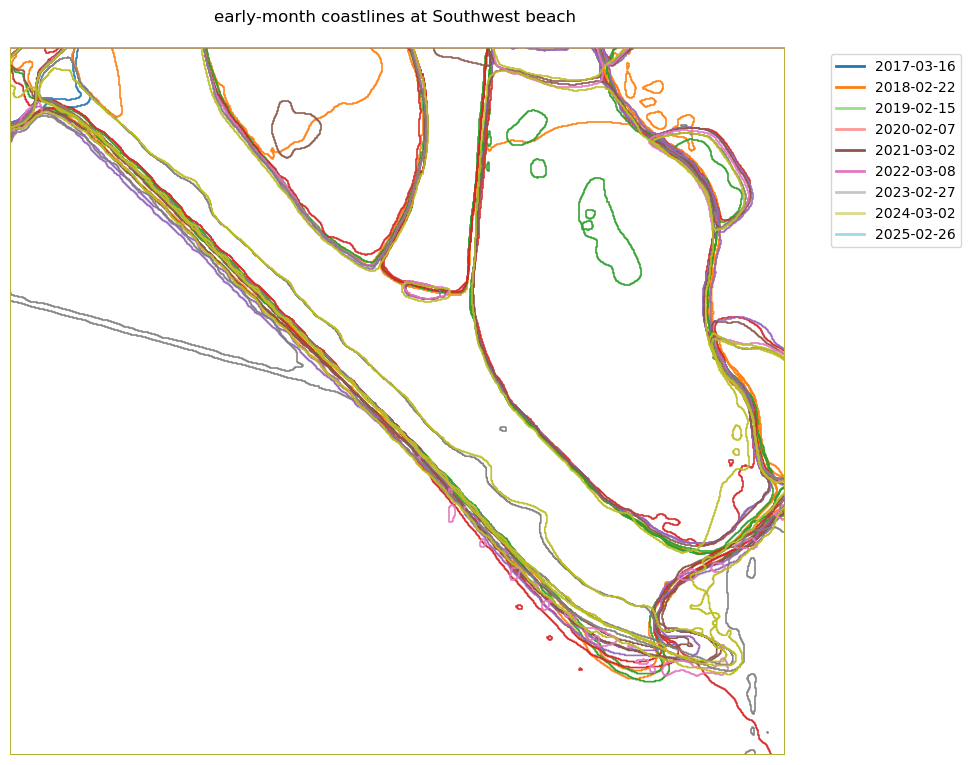

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Southeast at early season to SAM_results/study_areas/early_Southeast_sam_coastlines_combined.png


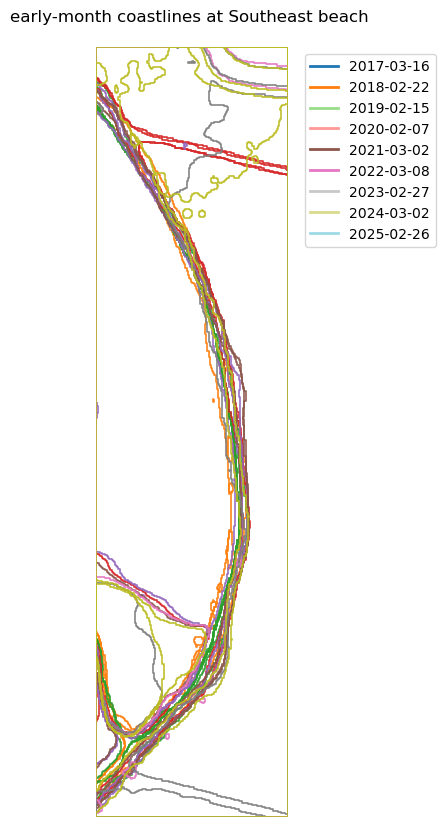

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Northwest at mid season to SAM_results/study_areas/mid_Northwest_sam_coastlines_combined.png


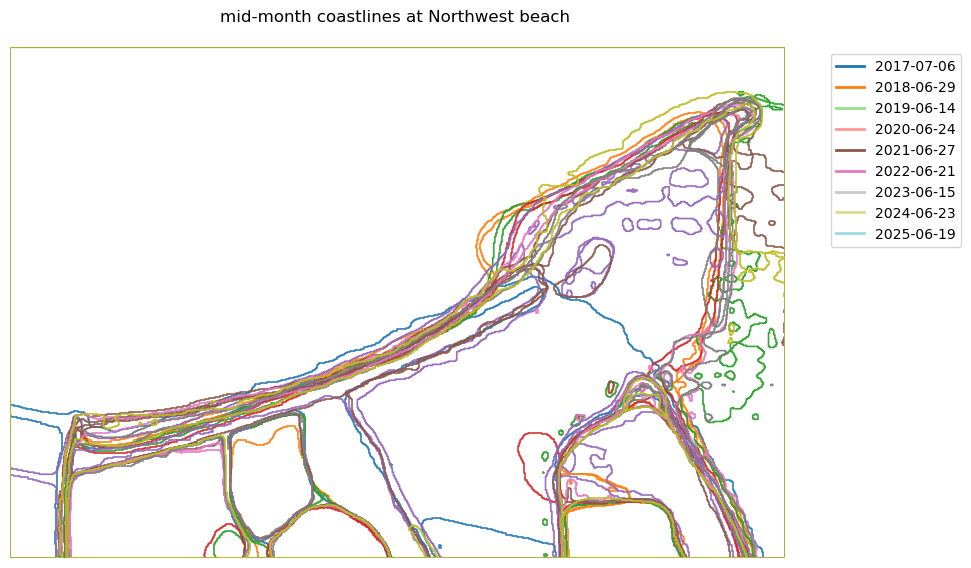

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Southwest at mid season to SAM_results/study_areas/mid_Southwest_sam_coastlines_combined.png


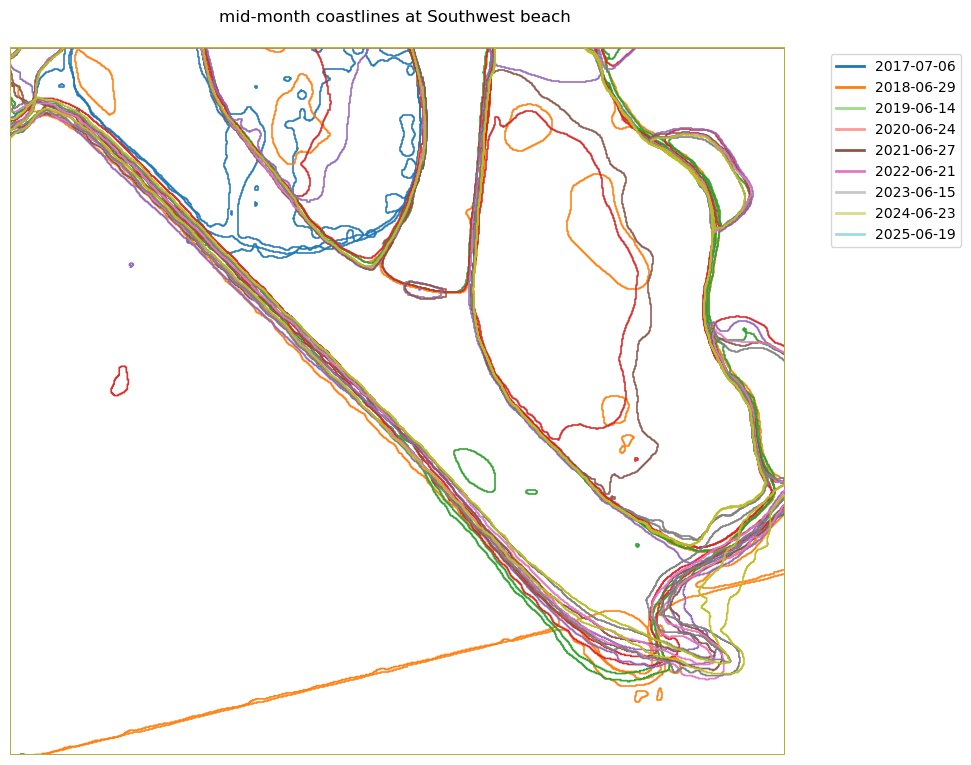

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Southeast at mid season to SAM_results/study_areas/mid_Southeast_sam_coastlines_combined.png


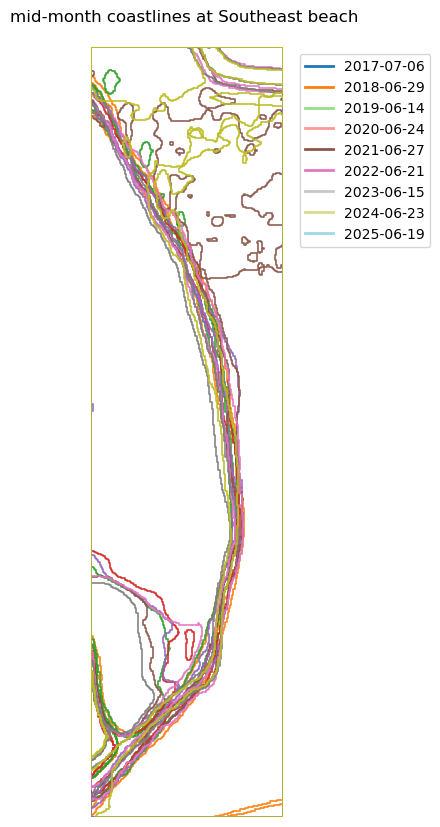

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Northwest at late season to SAM_results/study_areas/late_Northwest_sam_coastlines_combined.png


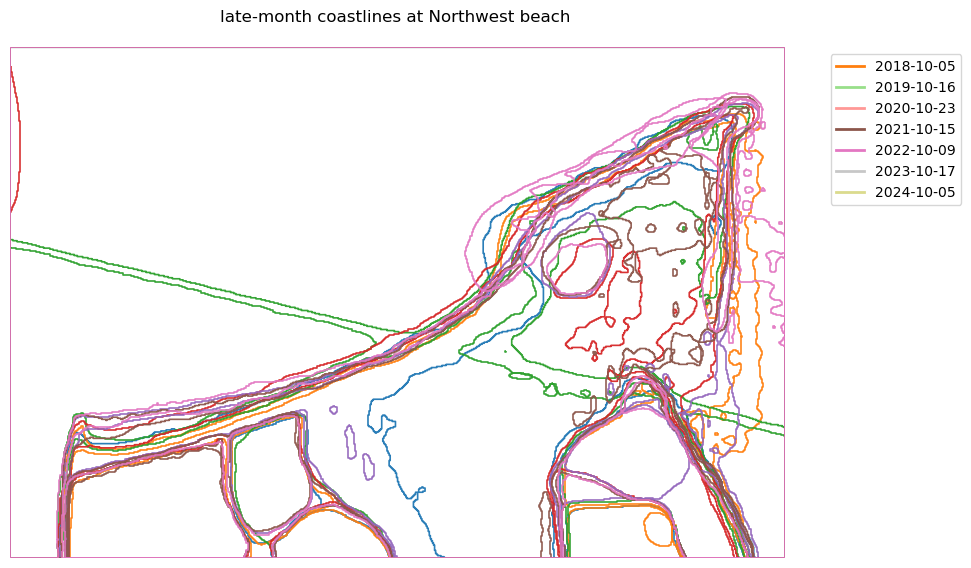

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Southwest at late season to SAM_results/study_areas/late_Southwest_sam_coastlines_combined.png


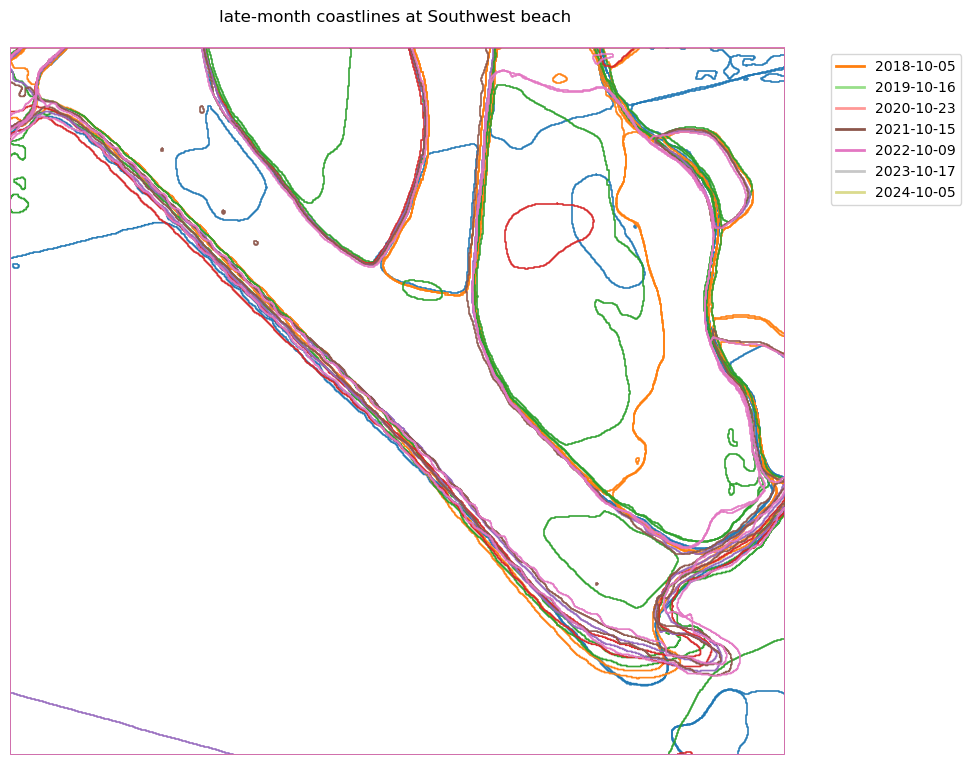

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\rasterio\windows.py:730: RasterioDeprecationWarning: round_shape is deprecated and will be removed in Rasterio 2.0.0.
  warnings.warn(


Saving combined overlay for Southeast at late season to SAM_results/study_areas/late_Southeast_sam_coastlines_combined.png


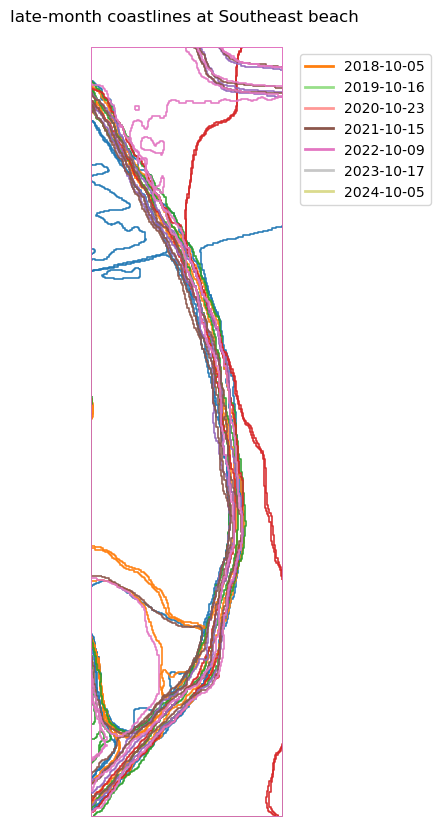

In [110]:
# Plot only one study area with saved coastlines overlayed
from shapely.geometry import box
import rasterio
import rasterio.windows

for s_name in seasons.keys():
    for study_name in study_area.keys():
        # choose study area name
        # study_name = "Southeast"  # change to "Northwest" or "Southwest" as needed
        minx, miny, maxx, maxy = study_area[study_name]
        bbox_geom = box(minx, miny, maxx, maxy)

        # season / folder containing coastlines
        # s_name = "mid"
        selected_files = seasons[s_name]
        coastline_folder = f"SAM_results/{s_name}"
        geojsons = sorted([f for f in os.listdir(coastline_folder) if f.endswith("_coastlines.geojson")])
        if not geojsons:
            raise FileNotFoundError(f"No *_coastlines.geojson files found in {coastline_folder}")

        # Ensure a year_colors mapping exists (create a default if missing)
        if "year_colors" not in globals():
            # try to build from available data (preferred: unique_years, else derive from selected_files)
            yrs = []
            if "unique_years" in globals():
                try:
                    yrs = sorted(int(y) for y in unique_years)
                except Exception:
                    yrs = []
            if not yrs and "selected_files" in globals():
                try:
                    yrs = sorted({int(os.path.basename(fn)[:4]) for fn in selected_files})
                except Exception:
                    yrs = []
            # fallback: a small fixed set
            if not yrs:
                yrs = [2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025]
            cmap = plt.get_cmap("tab10")
            year_colors = {np.int64(y): cmap(i % cmap.N) for i, y in enumerate(sorted(yrs))}
            # also ensure int keys map (some code may use int instead of np.int64)
            for k, v in list(year_colors.items()):
                year_colors[int(k)] = v

        # reference raster (use last selected file as reference)
        ref_tif = os.path.join(folder, selected_files[2])

        # read raster window for bbox
        with rasterio.open(ref_tif) as src:
            # ensure CRS alignment between bbox and raster (assume bbox already in raster CRS)
            win = rasterio.windows.from_bounds(minx, miny, maxx, maxy, src.transform)
            # round to integer window
            win = win.round_offsets().round_shape()
            arr = src.read(window=win)  # shape (bands, rows, cols)
            if arr.shape[0] >= 3:
                img = np.stack([arr[i] for i in range(3)], axis=-1).astype(np.float32)
            else:
                a = arr[0].astype(np.float32)
                img = np.repeat(a[:, :, None], 3, axis=2)
            # normalize for display
            img = (img - img.min()) / (img.max() - img.min() + 1e-12)

            # compute extent from window transform
            win_t = src.window_transform(win)
            left, top = win_t * (0, 0)
            right, bottom = win_t * (img.shape[1], img.shape[0])
            extent = [left, right, bottom, top]  # imshow expects [xmin, xmax, ymin, ymax]

            raster_crs = src.crs

        # plot cropped basemap and coastlines that intersect the bbox
        fig, ax = plt.subplots(figsize=(10, 10))
        # ax.imshow(img, extent=extent)
        # ax.set_title(f"{s_name}-month coastlines at {study_name} beach \n overlayed on base image of {selected_files[2][:10]}")
        ax.set_title(f"{s_name}-month coastlines at {study_name} beach \n")
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)
        ax.axis("off")

        import matplotlib.pyplot as plt
        from matplotlib.cm import get_cmap

        # Prepare a colormap
        cmap = plt.get_cmap("tab10")  # You can use other colormaps like "viridis", "plasma", etc.
        colors = [cmap(i % cmap.N) for i in range(len(geojsons))]  # Generate unique colors for each file

        for i, gj in enumerate(geojsons):
            gj_path = os.path.join(coastline_folder, gj)
            gdf = gpd.read_file(gj_path)
            
            # Reproject if needed
            if gdf.crs != raster_crs:
                try:
                    gdf = gdf.to_crs(raster_crs)
                except Exception:
                    print(f"Skipping (CRS mismatch, cannot reproject): {gj}")
                    continue
            
            # Select only geometries intersecting the bounding box
            sel = gdf[gdf.geometry.intersects(bbox_geom)]
            if sel.empty:
                continue
            
            # Clip to bounding box for cleaner plotting
            try:
                sel_clip = sel.clip(bbox_geom)
            except Exception:
                sel_clip = sel  # Fallback to full selection if clipping fails
            
            # Plot with a unique color
            sel_clip.plot(ax=ax, facecolor="none", edgecolor=colors[i], linewidth=1.2, alpha=0.95)

        # add legend with years if possible
        legend_items = []
        for i, gj in enumerate(geojsons):
            year_str = gj[:4]
            try:
                year = int(year_str)
                color = year_colors.get(year, colors[i])
                legend_items.append(Line2D([0], [0], color=color, lw=2, label=gj[:10]))
            except Exception:
                continue

        plt.legend(handles=legend_items, bbox_to_anchor=(1.05, 1), loc='upper left')

        # save output
        out_folder = "SAM_results/study_areas/"
        out_combined = os.path.join(out_folder, f"{s_name}_{study_name}_sam_coastlines_combined.png")
        plt.savefig(out_combined, bbox_inches="tight", dpi=200)
        #print plot status
        print(f"Saving combined overlay for {study_name} at {s_name} season to {out_combined}")
        plt.show()

## Plot coastlines in the study areas